In [1]:
import pandas as pd
import numpy as np

import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory 

import warnings
warnings.filterwarnings("ignore")

# Chapter 1: Giới thiệu Plotly
Enter the world of Plotly! In this first chapter, you’ll learn different ways to create plots and receive an introduction to univariate plots. You’ll then build several popular plot types, including box plots and histograms, and discover how to style them using the Plotly color options.

## Visualization với 1 biến
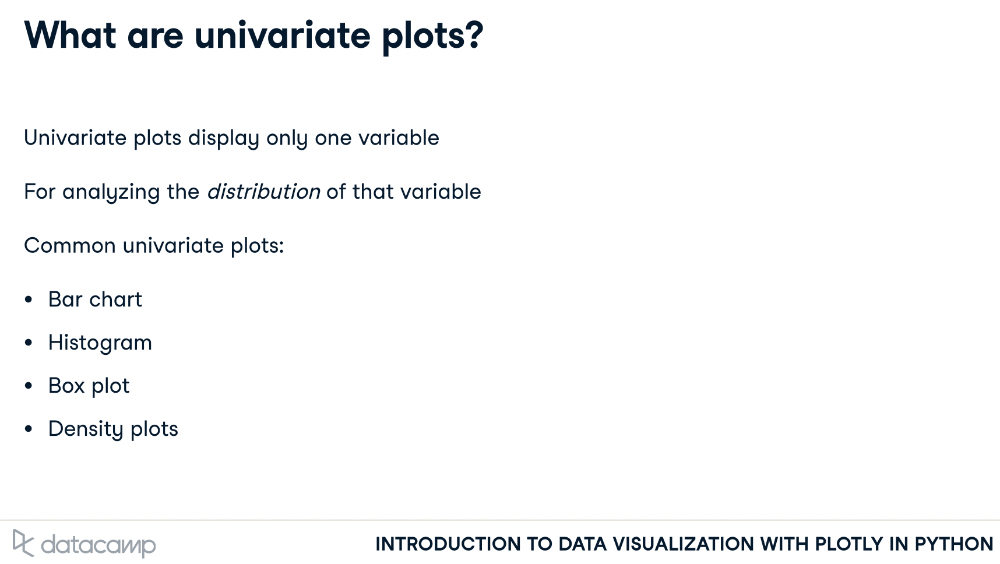

In [2]:
figure_config = dict({ "data": [{"type": "bar",
              "x": ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"],
              "y": [28, 27, 25, 31, 32, 35, 36]}],
            "layout": {"title": {"text": "Temperatures of the week",
            "x": 0.5, "font": {'color': 'red', 'size': 15}}}})
fig = go.Figure(figure_config)
fig.show()

In [3]:
weekly_temps = pd.DataFrame({
    'day': ['Monday', 'Tuesday',
            'Wednesday', 'Thursday', 'Friday',
            'Saturday', 'Sunday'],
    'temp': [28, 27, 25, 31, 32, 35, 36]})
fig = px.bar(data_frame=weekly_temps, x='day', y='temp')
fig.show()

In [4]:
penguins = pd.read_csv("datasets/penguins.csv")
penguins.head()

,Unnamed: 0,studyName,Sample Number,Species,Region,Island,Stage,Individual ID,Clutch Completion,Date Egg,Culmen Length (mm),Culmen Depth (mm),Flipper Length (mm),Body Mass (g),Sex,Delta 15 N (o/oo),Delta 13 C (o/oo),Comments
0,1,PAL0708,1,Adelie Penguin (Pygoscelis adeliae),Anvers,Torgersen,"Adult, 1 Egg Stage",N1A1,Yes,2007-11-11,39.1,18.7,181.0,3750.0,MALE,NaN,NaN,Not enough blood for isotopes.
1,2,PAL0708,2,Adelie Penguin (Pygoscelis adeliae),Anvers,Torgersen,"Adult, 1 Egg Stage",N1A2,Yes,2007-11-11,39.5,17.4,186.0,3800.0,FEMALE,8.94956,-24.69454,NaN
2,3,PAL0708,3,Adelie Penguin (Pygoscelis adeliae),Anvers,Torgersen,"Adult, 1 Egg Stage",N2A1,Yes,2007-11-16,40.3,18.0,195.0,3250.0,FEMALE,8.36821,-25.33302,NaN
3,4,PAL0708,4,Adelie Penguin (Pygoscelis adeliae),Anvers,Torgersen,"Adult, 1 Egg Stage",N2A2,Yes,2007-11-16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Adult not sampled.
4,5,PAL0708,5,Adelie Penguin (Pygoscelis adeliae),Anvers,Torgersen,"Adult, 1 Egg Stage",N3A1,Yes,2007-11-16,36.7,19.3,193.0,3450.0,FEMALE,8.76651,-25.32426,NaN


In [5]:
# histogram
fig = px.histogram(data_frame=penguins, x='Body Mass (g)', nbins=10)
fig.show() 

In [6]:
# box plot
fig = px.box(data_frame=penguins, y='Flipper Length (mm)')
fig.show()

## Customizing with color
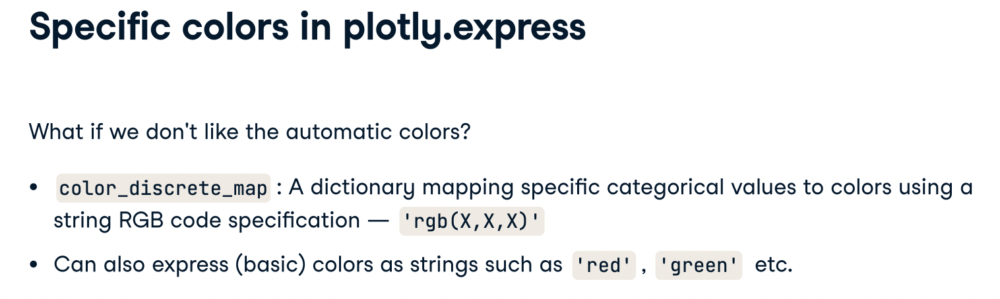
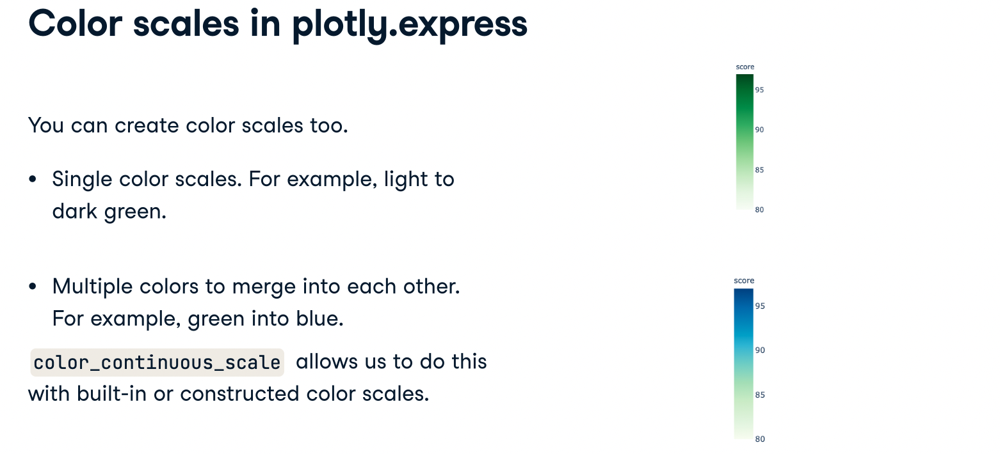

### Specific colors discrete

In [7]:
revenues = pd.read_csv("datasets/revenue_data2.csv")
revenues.head()

,Rank,Company,Revenue,employees,Industry,age
0,1,Walmart,523964,"2,300,000",Tech,44
1,2,Sinopec Group,407009,"71,200",Tech,56
2,3,State Grid,383906,"377,000",Oil,21
3,4,China National Petroleum,379130,"123,000",Tech,33
4,5,Royal Dutch Shell,352106,"260,000",Tech,70


In [8]:
revenues.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200 entries, 0 to 199
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Rank       200 non-null    int64 
 1   Company    200 non-null    object
 2   Revenue    200 non-null    object
 3   employees  200 non-null    object
 4   Industry   200 non-null    object
 5   age        200 non-null    int64 
dtypes: int64(2), object(4)
memory usage: 9.5+ KB


In [9]:
# xoá dấu ',' trong dữ liệu cột employees
revenues['employees'] = revenues['employees'].str.replace(",", "")

In [10]:
# Bỏ dòng có giá trị là 'Unknow' ở cột Revenue
revenues = revenues[revenues['Revenue'] != 'Unknown']

In [11]:
revenues[['Revenue', 'employees']] = revenues[['Revenue', 'employees']].astype(float)
revenues.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 199 entries, 0 to 198
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Rank       199 non-null    int64  
 1   Company    199 non-null    object 
 2   Revenue    199 non-null    float64
 3   employees  199 non-null    float64
 4   Industry   199 non-null    object 
 5   age        199 non-null    int64  
dtypes: float64(2), int64(2), object(2)
memory usage: 10.9+ KB


In [12]:
# Create the industry-color map
ind_color_map = {'Tech': 'rgb(124, 250, 120)',
				         'Oil': 'rgb(112,128,144)', 
                 'Pharmaceuticals': 'rgb(137, 109, 247)',
				         'Professional Services': 'rgb(255, 0, 0)',
                 'Retail': 'rgb(50, 47, 247)',
                 'Legal': 'rgb(235, 207, 52)',
                 'Unknown': 'rgb(245, 66, 230)'}

# Create the basic box plot
fig = px.box(
  			# Set the data and y variable
  			data_frame=revenues, y='Revenue',
  			# Set the color map and variable
			  color_discrete_map=ind_color_map,
		  	color='Industry')

# Show the plot
fig.show()

### Color scale continuous

In [13]:
monthly_sales = pd.read_csv("datasets/monthly_sales.csv")
monthly_sales.head()

,Month Start,Month,Sales Volume,Sales Value,Returns Percentage,Average Feedback
0,1/1/20,January,56482,206231,3.48,4.41
1,1/2/20,February,46779,300835,3.99,2.47
2,1/3/20,March,51681,338870,1.30,4.22
3,1/4/20,April,63780,172543,1.08,1.19
4,1/5/20,May,70776,245770,2.16,2.45


In [14]:
fig = px.bar(data_frame=monthly_sales
             , x='Month'
             , y='Sales Value'
             , color='Sales Value'
             , color_continuous_scale='greens')
fig.show()

# Chapter 2: Customizing plots
Add to your Plotly toolkit as you explore and implement bivariate plots. Next, you’ll explore how to customize your plots to make them look amazing with annotations, hover information, legends, and custom axis titles and scales.

## Bivariate visulizations 
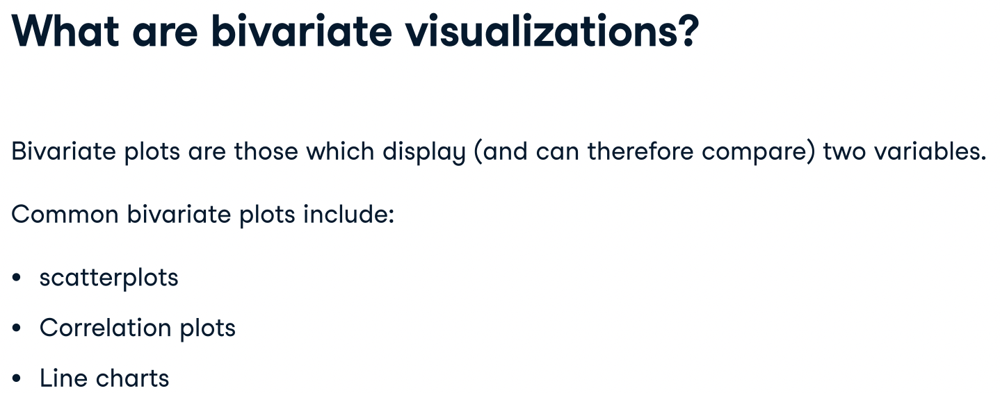

### Scatterplot
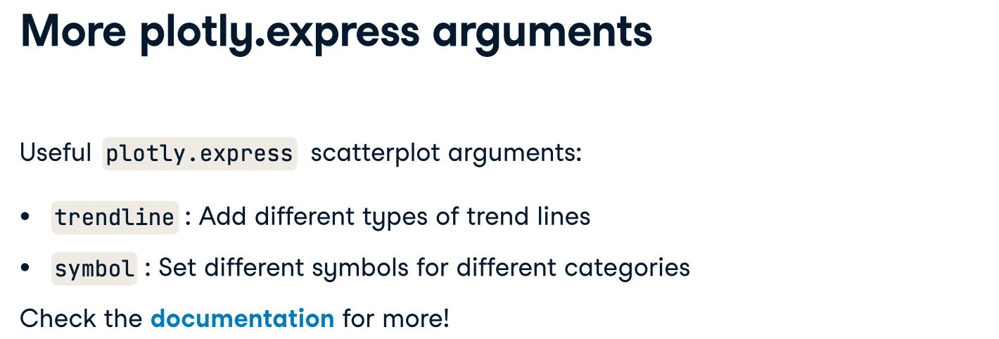

In [15]:
penguins = pd.read_csv("datasets/penguins.csv")
fig = px.scatter(data_frame=penguins
                 , x="Body Mass (g)"
                 , y="Flipper Length (mm)"
                 , trendline='ols'
                 )
fig.show()

### Line chart

In [16]:
AAPL = pd.read_csv("datasets/AAPL.csv")
fig = px.line(data_frame=AAPL
             , x='Date'
             , y='Open'
             , title='AAPL')
fig.show()

### Scatterplots and line plot with `graph_objects`
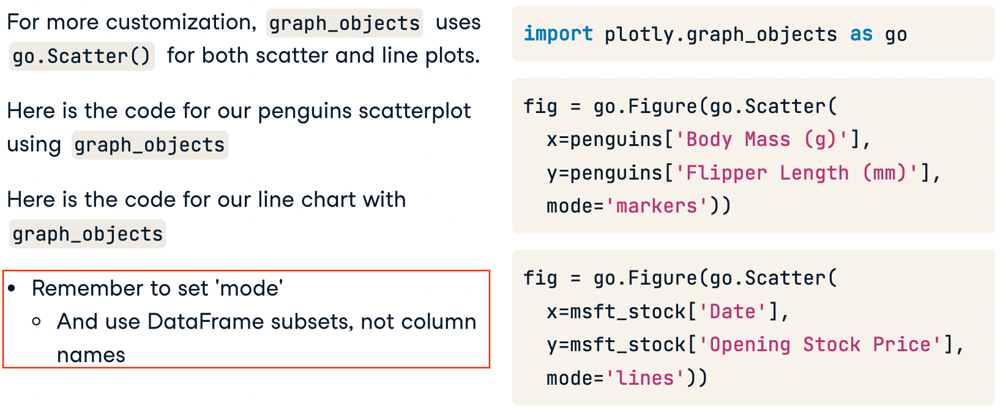
**Note**: `graph_objects` vs `plotly.express`? <br>
Nên sử dụng `graph_objects` hay `plotly.express`? Customization - `graph_objects` có nhiều option hơn.

In [17]:
fig = go.Figure(go.Scatter(
    x=penguins['Body Mass (g)'],
    y=penguins['Flipper Length (mm)'],
    mode='markers'))
fig.show()

In [18]:
fig = go.Figure(go.Scatter(
    x=AAPL['Date'],
    y=AAPL['Open'],
    mode='lines'))
fig.show()

### Correlation plot

In [19]:
cr = pd.read_csv("https://archive.ics.uci.edu/ml/machine-learning-databases/00560/SeoulBikeData.csv", encoding = 'ISO-8859-1')
cr.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


In [20]:
cr = cr.corr(method='pearson')
cr

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm)
Rented Bike Count,1.000000,0.410257,0.538558,-0.199780,0.121108,0.199280,0.379788,0.261837,-0.123074,-0.141804
Hour,0.410257,1.000000,0.124114,-0.241644,0.285197,0.098753,0.003054,0.145131,0.008715,-0.021516
Temperature(°C),0.538558,0.124114,1.000000,0.159371,-0.036252,0.034794,0.912798,0.353505,0.050282,-0.218405
Humidity(%),-0.199780,-0.241644,0.159371,1.000000,-0.336683,-0.543090,0.536894,-0.461919,0.236397,0.108183
Wind speed (m/s),0.121108,0.285197,-0.036252,-0.336683,1.000000,0.171507,-0.176486,0.332274,-0.019674,-0.003554
Visibility (10m),0.199280,0.098753,0.034794,-0.543090,0.171507,1.000000,-0.176630,0.149738,-0.167629,-0.121695
Dew point temperature(°C),0.379788,0.003054,0.912798,0.536894,-0.176486,-0.176630,1.000000,0.094381,0.125597,-0.150887
Solar Radiation (MJ/m2),0.261837,0.145131,0.353505,-0.461919,0.332274,0.149738,0.094381,1.000000,-0.074290,-0.072301
Rainfall(mm),-0.123074,0.008715,0.050282,0.236397,-0.019674,-0.167629,0.125597,-0.074290,1.000000,0.008500
Snowfall (cm),-0.141804,-0.021516,-0.218405,0.108183,-0.003554,-0.121695,-0.150887,-0.072301,0.008500,1.000000


In [21]:
fig = go.Figure(go.Heatmap(
                x=cr.columns
                , y=cr.columns
                , z=cr.values.tolist()
                , colorscale='rdylgn', zmin=-1, zmax=1))
fig.show()

## Customizing hover information and legends
**Hover information**: là những đoạn text và dữ liệu xuất hiện khi ta di chuyển chuột đến một điểm dữ liệu trên biểu đồ. Có thể xem thông tin xuất hiện theo mặc định của Plotly nhưng ta cũng có thể customize nó. <br>
**Legend**: là phần chú thích bên cạnh biểu đồ cung cấp thông tin của những thành phần của đồ thị, đặc biệt là màu sắc hoặc kiểu dáng. **Legends** thường tự xuất hiện với plotly.

### Other default hover information
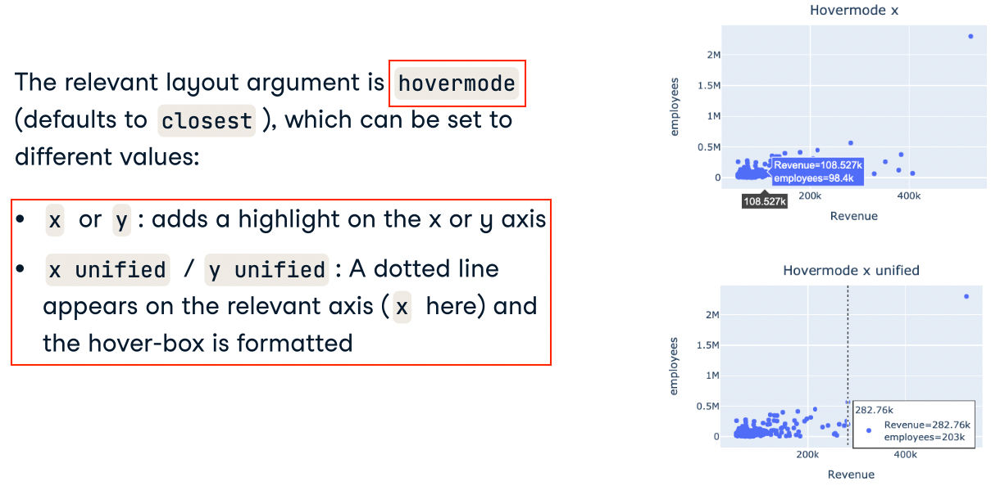
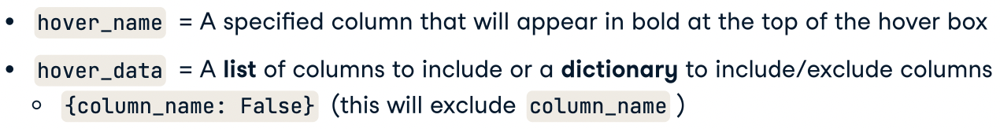
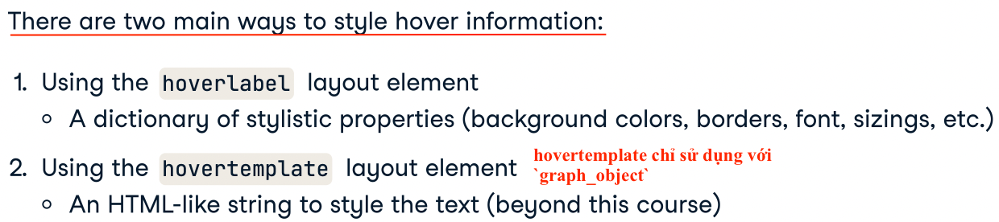

In [22]:
fig = px.scatter(data_frame=revenues
                , x="Revenue"
                , y="employees"
                , hover_data=['age'])

fig.update_layout(hovermode="x unified"
                , hoverlabel=dict(
                bgcolor="white"))

fig.show()

### What is a legend?
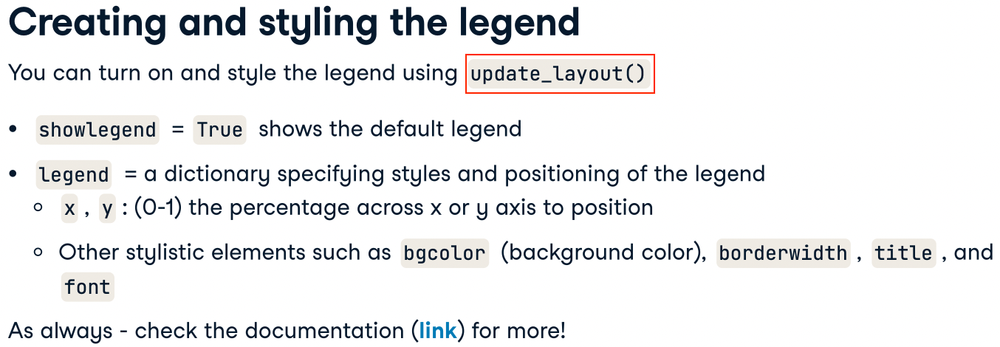

In [23]:
fig = px.scatter(data_frame=revenues
                , x="employees"
                , y="Revenue"
                , color="Industry"
                , hover_data=['Rank'])

fig.update_layout(hovermode="x unified"
                , hoverlabel=dict(bgcolor="white", font_size=15, font_family="Rockwell"))

fig.update_layout({
    'showlegend': True,
    'legend': {'title': "Industry", 'x': 0.5, 'y': 0.5, 'bgcolor': 'rgb(246,228,129)'}
})

fig.show()

In [24]:
fig = px.scatter(data_frame=revenues
                , x="employees"
                , y="Revenue"
                , color="Industry"
                , hover_data=['Rank', 'Company'])

fig.update_layout(hoverlabel=dict(bgcolor="white", font_size=15, font_family="Rockwell"))

fig.update_layout({
    'showlegend': True,
    'legend': {'title': "Industry", 'bgcolor': 'rgb(246,228,129)'}
})

fig.show()

## Adding annotations
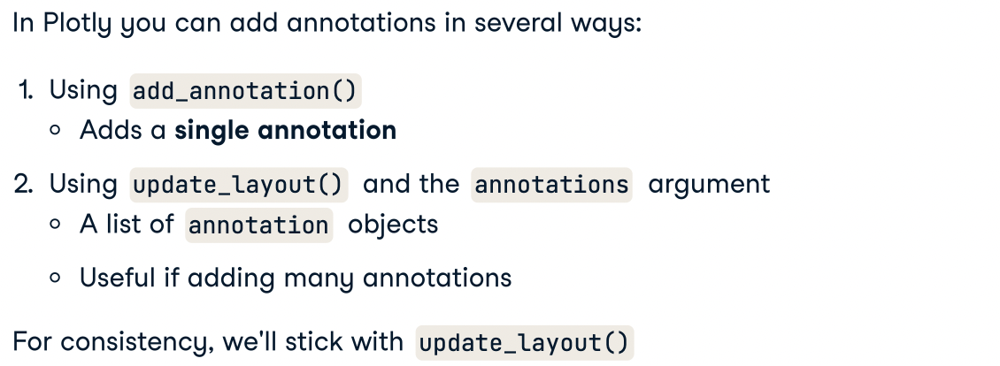

### `add_annotation()`

In [25]:
# add_annotation()
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=[0, 1, 2, 3, 4, 5, 6, 7, 8],
    y=[0, 1, 3, 2, 4, 3, 4, 6, 5]
))
fig.add_trace(go.Scatter(
    x=[0, 1, 2, 3, 4, 5, 6, 7, 8],
    y=[0, 4, 5, 1, 2, 2, 3, 4, 2]
))

fig.add_annotation(x=2, y=5,
            text="Text annotation with arrow",
            showarrow=True,
            arrowhead=1)
fig.add_annotation(x=4, y=4,
            text="Text annotation without arrow",
            showarrow=False,
            yshift=10)

fig.update_layout(showlegend=False)

fig.show()

### `update_layout()`
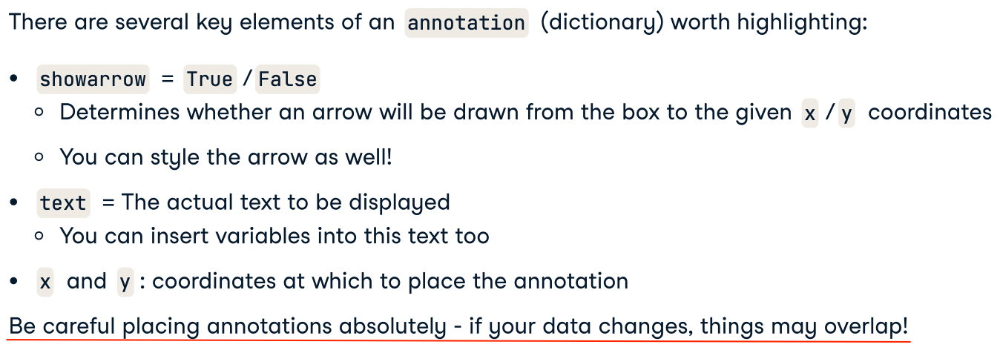
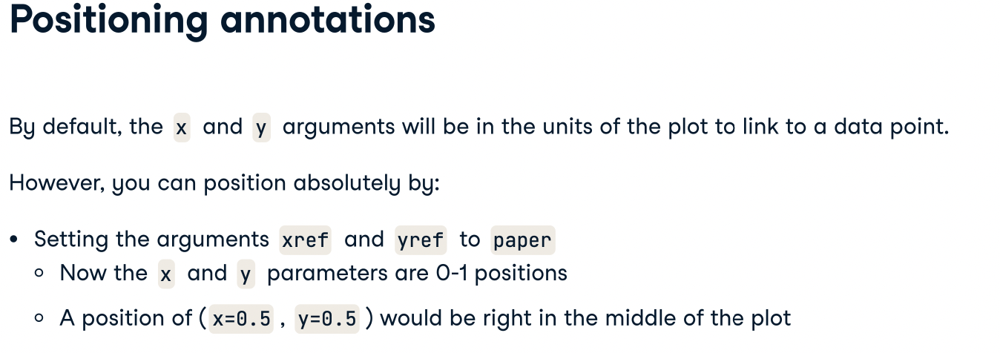

In [26]:
revenues

,Rank,Company,Revenue,employees,Industry,age
0,1,Walmart,523964.0,2300000.0,Tech,44
1,2,Sinopec Group,407009.0,71200.0,Tech,56
2,3,State Grid,383906.0,377000.0,Oil,21
3,4,China National Petroleum,379130.0,123000.0,Tech,33
4,5,Royal Dutch Shell,352106.0,260000.0,Tech,70
...,...,...,...,...,...,...
194,195,Vinci,54788.0,260000.0,Unknown,71
195,196,Auchan Holding,54672.0,49000.0,Unknown,74
196,197,Tencent Holdings,54613.0,14715.0,Unknown,78
197,198,Nippon Steel Corporation,54465.0,57750.0,Unknown,9


In [27]:
my_annotation = {
    'x': 215111, 'y': 449000,
    'showarrow': True, 'arrowhead': 3,
    'text': "Our company is doing well", 
    'font': {'size': 10, 'color': 'black'}}

fig = px.scatter(data_frame=revenues, x='Revenue', y='employees')

fig.update_layout(annotations = [my_annotation])

fig.show()

## Editing plot axes

### Editing axis titles
* **Default**: 
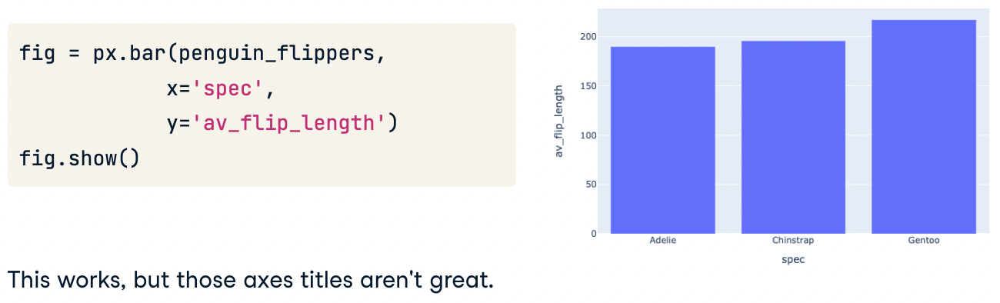
* **Editing**:
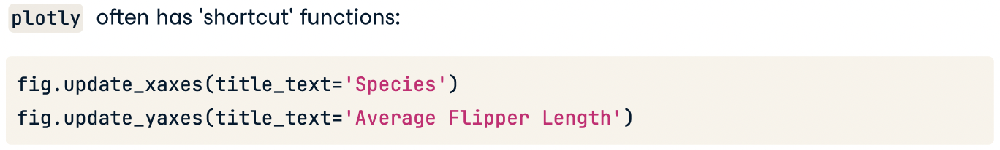
* **Cách khác sử dụng `update_layout()`**:
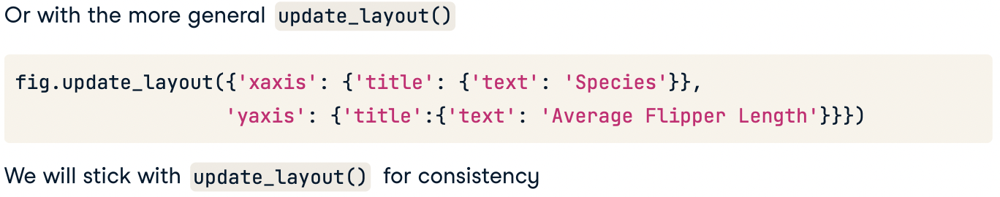

### Editing axes ranges

In [28]:
penguins

,Unnamed: 0,studyName,Sample Number,Species,Region,Island,Stage,Individual ID,Clutch Completion,Date Egg,Culmen Length (mm),Culmen Depth (mm),Flipper Length (mm),Body Mass (g),Sex,Delta 15 N (o/oo),Delta 13 C (o/oo),Comments
0,1,PAL0708,1,Adelie Penguin (Pygoscelis adeliae),Anvers,Torgersen,"Adult, 1 Egg Stage",N1A1,Yes,2007-11-11,39.1,18.7,181.0,3750.0,MALE,NaN,NaN,Not enough blood for isotopes.
1,2,PAL0708,2,Adelie Penguin (Pygoscelis adeliae),Anvers,Torgersen,"Adult, 1 Egg Stage",N1A2,Yes,2007-11-11,39.5,17.4,186.0,3800.0,FEMALE,8.94956,-24.69454,NaN
2,3,PAL0708,3,Adelie Penguin (Pygoscelis adeliae),Anvers,Torgersen,"Adult, 1 Egg Stage",N2A1,Yes,2007-11-16,40.3,18.0,195.0,3250.0,FEMALE,8.36821,-25.33302,NaN
3,4,PAL0708,4,Adelie Penguin (Pygoscelis adeliae),Anvers,Torgersen,"Adult, 1 Egg Stage",N2A2,Yes,2007-11-16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Adult not sampled.
4,5,PAL0708,5,Adelie Penguin (Pygoscelis adeliae),Anvers,Torgersen,"Adult, 1 Egg Stage",N3A1,Yes,2007-11-16,36.7,19.3,193.0,3450.0,FEMALE,8.76651,-25.32426,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
339,340,PAL0910,64,Chinstrap penguin (Pygoscelis antarctica),Anvers,Dream,"Adult, 1 Egg Stage",N98A2,Yes,2009-11-19,55.8,19.8,207.0,4000.0,MALE,9.70465,-24.53494,NaN
340,341,PAL0910,65,Chinstrap penguin (Pygoscelis antarctica),Anvers,Dream,"Adult, 1 Egg Stage",N99A1,No,2009-11-21,43.5,18.1,202.0,3400.0,FEMALE,9.37608,-24.40753,Nest never observed with full clutch.
341,342,PAL0910,66,Chinstrap penguin (Pygoscelis antarctica),Anvers,Dream,"Adult, 1 Egg Stage",N99A2,No,2009-11-21,49.6,18.2,193.0,3775.0,MALE,9.46180,-24.70615,Nest never observed with full clutch.
342,343,PAL0910,67,Chinstrap penguin (Pygoscelis antarctica),Anvers,Dream,"Adult, 1 Egg Stage",N100A1,Yes,2009-11-21,50.8,19.0,210.0,4100.0,MALE,9.98044,-24.68741,NaN


In [29]:
penguins['Species'].value_counts().max()


152

In [30]:
fig = px.bar(data_frame=penguins, x='Species')

fig.update_layout({'yaxis': {'range': [0, penguins['Species'].value_counts().max() + 50]}})

fig.show()

### Data scale
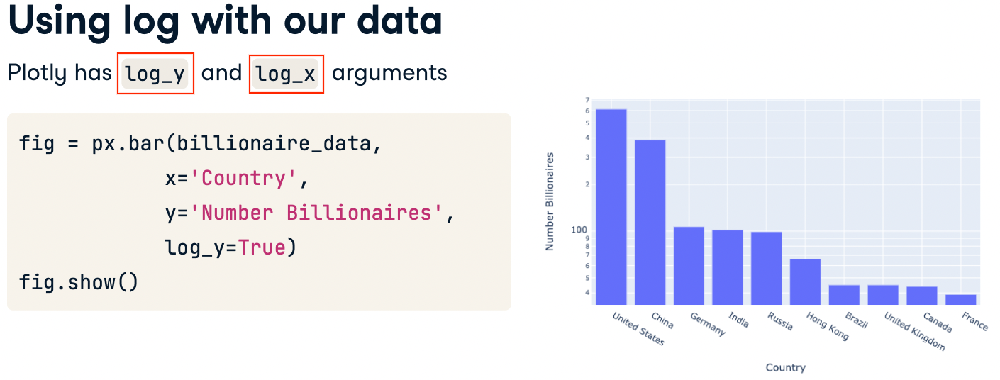

In [31]:
billionaire_data = pd.DataFrame({
    'Country': ['US', 'China', 'Germany', 'Indian', 'Russia', 'Hong Kong', 'Brazil', 'UK', 'Canada', 'France'],
    'Number Billionaires': [614, 389, 107, 102, 99, 66, 45, 45, 44, 39]})
billionaire_data

,Country,Number Billionaires
0,US,614
1,China,389
2,Germany,107
3,Indian,102
4,Russia,99
5,Hong Kong,66
6,Brazil,45
7,UK,45
8,Canada,44
9,France,39


In [32]:
fig = px.bar(data_frame=billionaire_data\
             , x='Country', y='Number Billionaires')

fig.show()

In [33]:
fig = px.bar(data_frame=billionaire_data\
             , x='Country', y='Number Billionaires'\
             , log_y=True)

fig.show()

# Chapter 3: Advanced Customization
Take your Plotly graphs to the next level with more advanced customizations. Through hands-on exercises, you’ll learn how to layer multiple interactive chart types in the same plot (such as a bar chart with line chart over the top). You’ll then create time-series selectors, such as year to date (YTD), to help you zoom in and out of your line charts.

## Subplots

### traces
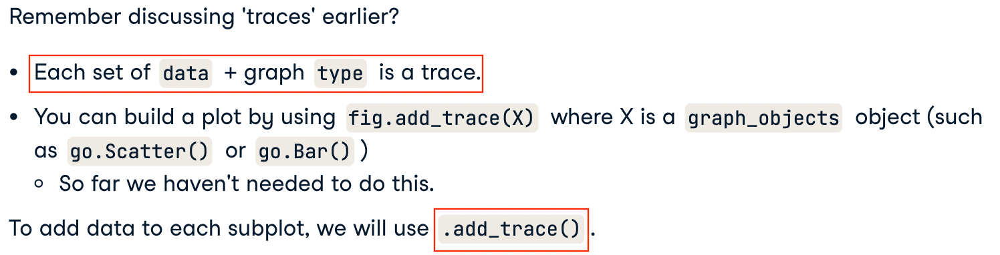
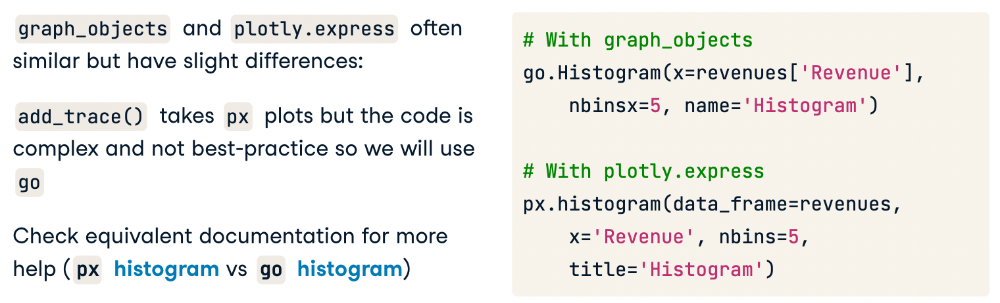
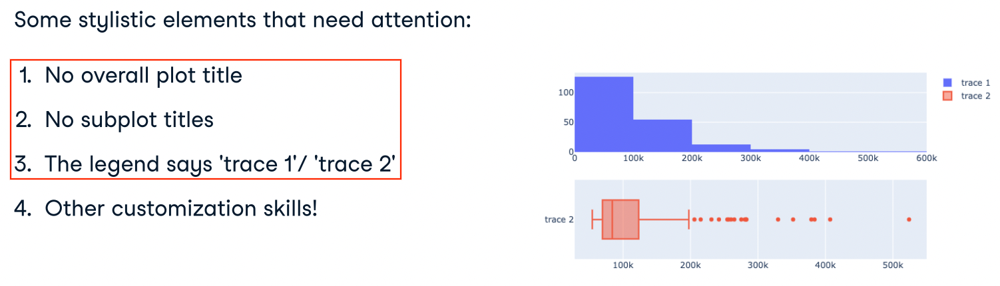

In [34]:
from plotly.subplots import make_subplots

In [35]:
fig = make_subplots(rows=2, cols=1)
fig.add_trace(
    go.Histogram(x=revenues['Revenue'], nbinsx=5)\
    , row=1, col=1)
fig.add_trace(
    go.Box(x=revenues['Revenue'], hovertext=revenues['Company'])\
    , row=2, col=1)

fig.show()

In [36]:
# Subplot titles 
fig = make_subplots(rows=2, cols=1, subplot_titles=['Histogram  of company revenues', 'Box plot of company revenues'])
fig.add_trace(
    go.Histogram(x=revenues['Revenue'], nbinsx=5)\
    , row=1, col=1)
fig.add_trace(
    go.Box(x=revenues['Revenue'], hovertext=revenues['Company'])\
    , row=2, col=1)

### add in traces (fig.add_trace())
fig.update_layout({'title': {'text': 'Plots of company revenues', 'x': 0.5, 'y': 0.9}})

fig.show()

In [37]:
# Subplot legends
fig = make_subplots(rows=2, cols=1, subplot_titles=['Histogram  of company revenues', 'Box plot of company revenues'])

fig.add_trace(
    go.Histogram(x=revenues['Revenue'], nbinsx=5, name='Histogram')\
    , row=1, col=1)
fig.add_trace(
    go.Box(x=revenues['Revenue'], hovertext=revenues['Company'], name='Box plot')\
    , row=2, col=1)

### add in traces (fig.add_trace())
fig.update_layout({'title': {'text': 'Plots of company revenues', 'x': 0.5, 'y': 0.9}})

fig.show()

In [38]:
penguins.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 344 entries, 0 to 343
Data columns (total 18 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Unnamed: 0           344 non-null    int64  
 1   studyName            344 non-null    object 
 2   Sample Number        344 non-null    int64  
 3   Species              344 non-null    object 
 4   Region               344 non-null    object 
 5   Island               344 non-null    object 
 6   Stage                344 non-null    object 
 7   Individual ID        344 non-null    object 
 8   Clutch Completion    344 non-null    object 
 9   Date Egg             344 non-null    object 
 10  Culmen Length (mm)   342 non-null    float64
 11  Culmen Depth (mm)    342 non-null    float64
 12  Flipper Length (mm)  342 non-null    float64
 13  Body Mass (g)        342 non-null    float64
 14  Sex                  333 non-null    object 
 15  Delta 15 N (o/oo)    330 non-null    flo

In [39]:
penguins['Species'].value_counts()

Adelie Penguin (Pygoscelis adeliae)          152
Gentoo penguin (Pygoscelis papua)            124
Chinstrap penguin (Pygoscelis antarctica)     68
Name: Species, dtype: int64

### Stacked  subplots

In [40]:
fig = make_subplots(rows=3, cols=1)
row_num  = 1
for species in ['Adelie Penguin (Pygoscelis adeliae)', 'Gentoo penguin (Pygoscelis papua)', 'Chinstrap penguin (Pygoscelis antarctica)']:
    df = penguins[penguins['Species'] == species]
    fig.add_trace(go.Scatter(x=df['Culmen Length (mm)'], y=df['Culmen Depth (mm)'], name=species, mode='markers')
                  , row=row_num, col=1)
    row_num += 1

fig.show()

In [41]:
# shared axes, trong trường hợp này share cùng x-axis
fig = make_subplots(rows=3, cols=1, shared_xaxes=True)
row_num  = 1
for species in ['Adelie Penguin (Pygoscelis adeliae)', 'Gentoo penguin (Pygoscelis papua)', 'Chinstrap penguin (Pygoscelis antarctica)']:
    df = penguins[penguins['Species'] == species]
    fig.add_trace(go.Scatter(x=df['Culmen Length (mm)'], y=df['Culmen Depth (mm)'], name=species, mode='markers')
                  , row=row_num, col=1)
    row_num += 1

fig.show()

## Layering multiple plots (nhiều kiểu đồ thị khác nhau trên cùng một biểu đồ)
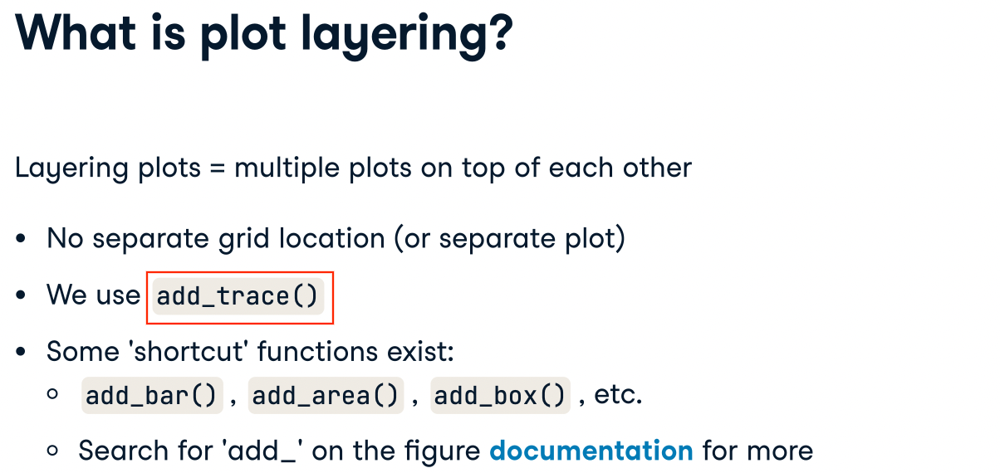
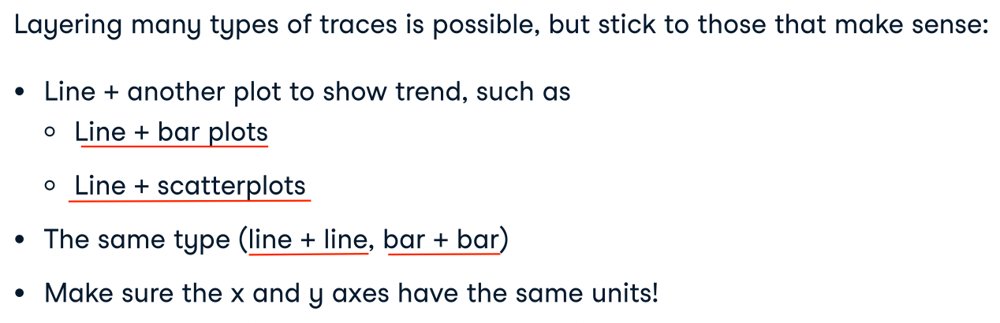

In [42]:
monthly_sales = pd.read_csv("datasets/monthly_sales.csv")
monthly_sales

,Month Start,Month,Sales Volume,Sales Value,Returns Percentage,Average Feedback
0,1/1/20,January,56482,206231,3.48,4.41
1,1/2/20,February,46779,300835,3.99,2.47
2,1/3/20,March,51681,338870,1.30,4.22
3,1/4/20,April,63780,172543,1.08,1.19
4,1/5/20,May,70776,245770,2.16,2.45
5,1/6/20,June,50680,273360,5.67,2.04
6,1/7/20,July,68691,200309,1.64,2.52
7,1/8/20,August,66942,239271,2.67,3.85
8,1/9/20,September,63790,345397,3.93,1.35
9,1/10/20,October,71900,155825,5.00,3.25


In [43]:
fig = go.Figure()
fig.add_trace(go.Bar(x=monthly_sales['Month']
                     , y=monthly_sales['Sales Volume']
                     , name='Sales Volume'))
fig.add_trace(go.Line(x=monthly_sales['Month']
                      , y=monthly_sales['Sales Value']
                      , name='Sales Value'
                      , mode='lines+markers'))

fig.show()

## Time buttons
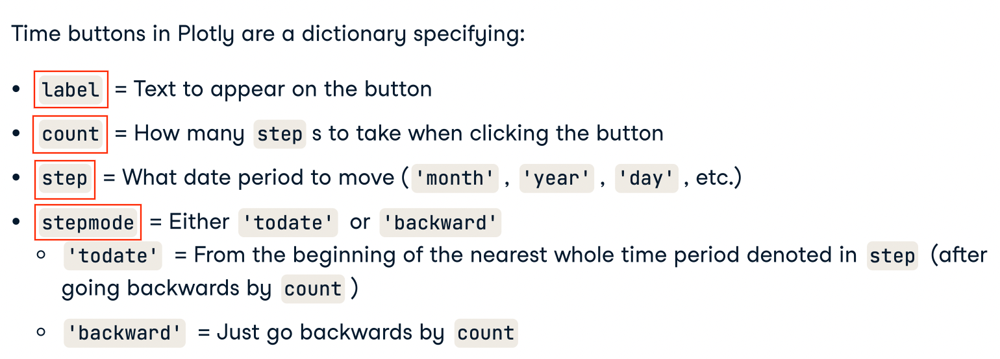
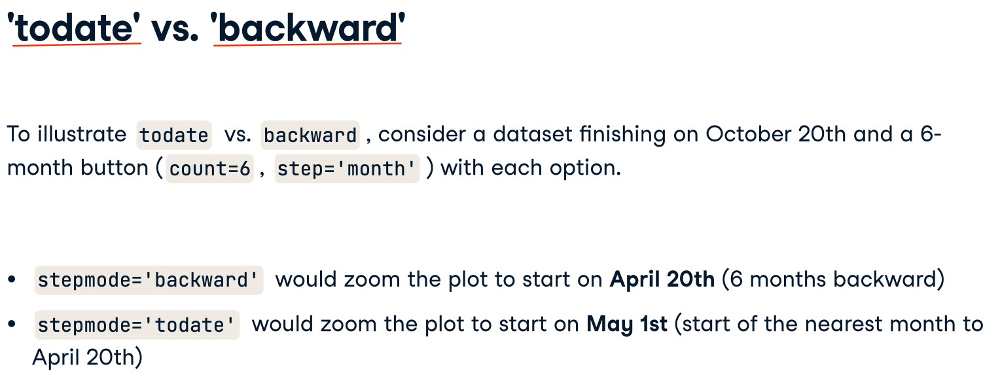
* **Sử dụng time buttons với `update_layout({'xasis': {'rangeselector': time_buttons}})`:**
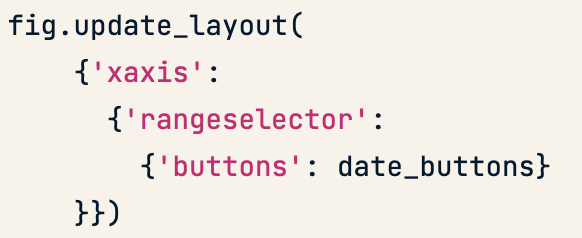<br>
* **hoặc sử dụng với `update_xaxes(rangeselector={'buttons': time_buttons})`:** <br>
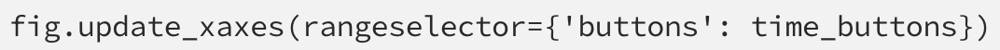

In [44]:
rain = pd.read_csv("datasets/rain.csv")
rain

,Date,Rainfall
0,1/1/20,0.0
1,2/1/20,0.2
2,3/1/20,0.0
3,4/1/20,0.0
4,5/1/20,0.0
...,...,...
300,27/10/20,13.6
301,28/10/20,0.0
302,29/10/20,15.3
303,30/10/20,0.0


In [45]:
rain.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 305 entries, 0 to 304
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Date      305 non-null    object 
 1   Rainfall  305 non-null    float64
dtypes: float64(1), object(1)
memory usage: 4.9+ KB


In [46]:
date_buttons = [{'label': "6MTD", 'count': 6, 'step': "month", 'stepmode': "todate"}
                , {'label': "2WTD", 'count': 14, 'step': "day", 'stepmode': "todate"}]

fig = go.Figure(go.Line(x=rain['Date'], y=rain['Rainfall']), {'title':"Rainfall (mm) in Sydney"})
# fig = px.line(data_frame=rain, x='Date', y='Rainfall', title='Rainfall (mm) in Sydney')
# fig.update_layout(title="Rainfall (mm) in Sydney")
fig.update_layout({'xaxis': 
                   {'rangeselector': 
                    {'buttons': date_buttons}}})

fig.show()

In [47]:
AAPL = pd.read_csv("datasets/AAPL.csv")
AAPL

,Date,Open,High,Low,Close,Adj Close,Volume
0,2019-08-30,210.160004,210.449997,207.199997,208.740005,206.689255,21143400
1,2019-09-03,206.429993,206.979996,204.220001,205.699997,203.679108,20023000
2,2019-09-04,208.389999,209.479996,207.320007,209.190002,207.134857,19188100
3,2019-09-05,212.000000,213.970001,211.509995,213.279999,211.184647,23913700
4,2019-09-06,214.050003,214.419998,212.509995,213.259995,211.164841,19362300
...,...,...,...,...,...,...,...
247,2020-08-24,514.789978,515.140015,495.750000,503.429993,503.429993,86484400
248,2020-08-25,498.790009,500.720001,492.209991,499.299988,499.299988,52873900
249,2020-08-26,504.720001,507.970001,500.329987,506.089996,506.089996,40755600
250,2020-08-27,508.570007,509.940002,495.329987,500.040009,500.040009,38888100


In [48]:
time_buttons = [
    {'count': 1, 'step': 'day', 'stepmode': 'todate', 'label': '1TD'},
    {'count': 14, 'step': 'day', 'stepmode': 'todate', 'label': '2WTD'},
    {'count': 6, 'step': 'month', 'stepmode': 'todate', 'label': '6MTD'},
    {'count': 1, 'step': 'year', 'stepmode': 'todate', 'label': '1YTD'}
]
fig = go.Figure()
fig.add_trace(go.Scatter(x=AAPL.index,y=AAPL['Open'],mode='lines',name='Open'))
fig.add_trace(go.Scatter(x=AAPL.index, y=AAPL['High'], mode='lines', name='High'))
fig.add_trace(go.Scatter(x=AAPL.index, y=AAPL['Low'], mode='lines', name='Low'))
fig.add_trace(go.Scatter(x=AAPL.index, y=AAPL['Close'], mode='lines', name='Close'))

fig.update_layout(hovermode="x unified")
fig.update_xaxes(rangeselector={'buttons': time_buttons})

# Chapter 4: Advanced Interactivity
In this final chapter, you’ll harness Plotly’s advanced user interactivity as you learn how to create buttons, dropdowns, and sliders that change everything from graph types to annotations and much more. Take your Plotly skills to the next level and build truly interactive user experiences.

## Custom buttons
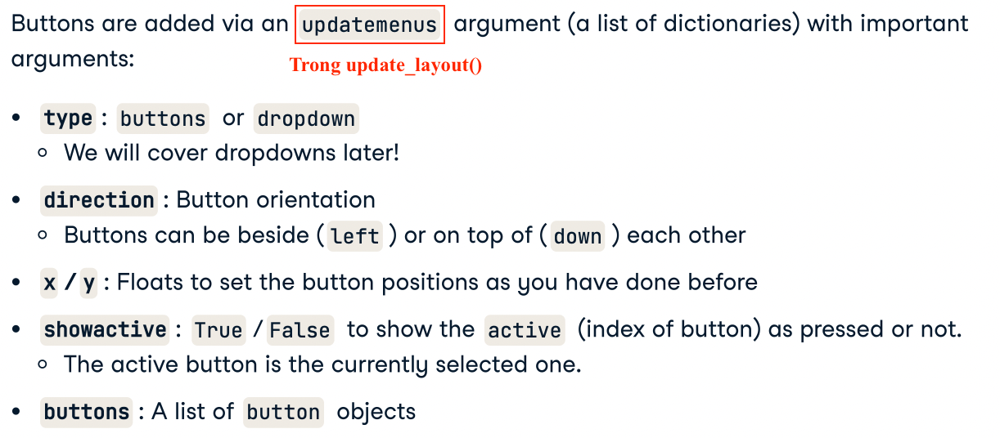

In [49]:
fig = px.bar(data_frame=revenues, x='Industry', y='Revenue', color='Industry')
fig.show()

In [50]:
fig = px.bar(data_frame=revenues, x='Industry', y='Revenue', color='Industry')

my_buttons = [{'label': "Bar plot", 'method': "update", 'args': [{'type': "bar"}]}
              , {'label': "scatterplot", 'method': "update", 'args': [{'types': "scatter", 'mode': "markers"}]}]


fig.update_layout({'updatemenus': [{'type': "buttons"
                                    , 'direction': 'down'
                                    , 'x': 1.3, 'y':0.5
                                    , 'showactive': True
                                    , 'active': 0
                                    , 'buttons': my_buttons}]})
fig.show()